In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly


In [2]:
import zipfile,fnmatch,os

rootPath = r"./"
pattern = '*.zip'
for root, dirs, files in os.walk(rootPath):
    for filename in fnmatch.filter(files, pattern):
        print(os.path.join(root, filename))
        zipfile.ZipFile(os.path.join(root, filename)).extractall(os.path.join(root, os.path.splitext(filename)[0]))


./062221_A02078.zip


In [3]:
dir = os.path.splitext(filename)[0]

os.listdir(dir)

['ACC.csv',
 'BVP.csv',
 'EDA.csv',
 'HR.csv',
 'IBI.csv',
 'info.txt',
 'tags.csv',
 'TEMP.csv']

In [4]:
ibi = pd.read_csv('./' + dir + '/IBI.csv')
mean_ibi = ibi[' IBI'].mean()

average_heart_rate = 60/mean_ibi


print('mean ibi is :', mean_ibi)
print('mean heart rate :', average_heart_rate.round())


mean ibi is : 0.7448725109752273
mean heart rate : 81.0


In [5]:
ibi.columns

Index(['1624362984.000000', ' IBI'], dtype='object')

In [6]:
import plotly.express as px
fig = px.scatter(ibi, y=' IBI')
fig.show()

In [7]:
rr = ibi[' IBI']

# RMSSD: take the square root of the mean square of the differences
rmssd = np.sqrt(np.mean(np.square(np.diff(rr))))
# Mean RR
mean_rr = np.mean(rr)
# SDNN
sdnn = np.std(rr)
# Mean HR
mean_hr = 60 * 1000/np.mean(rr)
# NNxx: sum absolute differences that are larger than 50ms
nnxx = np.sum(np.abs(np.diff(rr)) > 50)*1
# pNNx: fraction of nnxx of all rr-intervals
pnnx = 100 * nnxx / len(rr)

In [8]:
import peakutils
import math, sys

def bvpPeaks(signal):
    cb = np.array(signal)
    x = peakutils.indexes(cb, thres=0.02/max(cb), min_dist=0.1)
    y = []
    i = 0
    while (i < (len(x)-1)):
        if x[i+1] - x[i] < 15:
            y.append(x[i])
            x = np.delete(x, i+1)
        else:
            y.append(x[i])
        i += 1
    return y

def getRRI(signal, start, sample_rate):
    peakIDX = bvpPeaks(signal)
    spr = 1 / sample_rate # seconds between readings
    start_time = float(start)
    timestamp = [start_time, (peakIDX[0] * spr) + start_time ] 
    ibi = [0, 0]
    for i in range(1, len(peakIDX)):
        timestamp.append(peakIDX[i] * spr + start_time)
        ibi.append((peakIDX[i] - peakIDX[i-1]) * spr)

    df = pd.DataFrame({'Timestamp': timestamp, 'IBI': ibi})
    return df

def getHRV(data, avg_heart_rate):
    rri = np.array(data['IBI']) * 1000
    RR_list = rri.tolist()
    #RR_diff = []
    RR_sqdiff = []
    RR_diff_timestamp = []
    cnt = 2
    while (cnt < (len(RR_list)-1)): 
        #RR_diff.append(abs(RR_list[cnt+1] - RR_list[cnt])) 
        RR_sqdiff.append(math.pow(RR_list[cnt+1] - RR_list[cnt], 2)) 
        RR_diff_timestamp.append(data['Timestamp'][cnt])
        cnt += 1
    hrv_window_length = 10
    window_length_samples = int(hrv_window_length*(avg_heart_rate/60))
    #SDNN = []
    RMSSD = []
    index = 1
    for val in RR_sqdiff:
        if index < int(window_length_samples):
            #SDNNchunk = RR_diff[:index:]
            RMSSDchunk = RR_sqdiff[:index:]
        else:
            #SDNNchunk = RR_diff[(index-window_length_samples):index:]
            RMSSDchunk = RR_sqdiff[(index-window_length_samples):index:]
        #SDNN.append(np.std(SDNNchunk))
        RMSSD.append(math.sqrt(np.std(RMSSDchunk)))
        index += 1
    dt = np.dtype('Float64')
    #SDNN = np.array(SDNN, dtype=dt)
    RMSSD = np.array(RMSSD, dtype=dt)
    df = pd.DataFrame({'Timestamp': RR_diff_timestamp, 'HRV': RMSSD})
    return df



In [9]:
BVP_DF = pd.read_csv('./' + dir + '/BVP.csv')
HR_DF = pd.read_csv('./' + dir + '/HR.csv')

column = list(HR_DF)[0]
temp = HR_DF.drop(0, axis = 0)
HR = temp[column]
HR = HR.tolist()

column2 = list(BVP_DF)[0]
sample_rate = BVP_DF[column2][0]
temp = BVP_DF.drop(0, axis = 0)
temp['spData'] = 0
temp.loc[temp[column2] > 0, 'spData'] = temp[column2]
signal = temp['spData'].tolist()

RRI_DF = getRRI(signal, column2, sample_rate)
HRV_DF = getHRV(RRI_DF, np.mean(HR))

HRV_DF.to_csv('HRV.csv', index=False)

print('\n    Done, saved as: HRV.csv\n')

TypeError: data type 'Float64' not understood

In [10]:
import flirt.reader.empatica
ibis = flirt.reader.empatica.read_ibi_file_into_df('./' + dir + '/IBI.csv')
hrv_features = flirt.get_hrv_features(ibis['ibi'], 128, 1, ["td", "fd", "stat"], 0.2)

HRV features: 100%|██████████| 48996/48996 [00:50<00:00, 968.69it/s] 


Unable to remove memmapped file


In [11]:
hrv_features = hrv_features.dropna(how='any',axis=0)


In [12]:
hrv_features.reset_index(inplace=True)
hrv_features

,datetime,num_ibis,hrv_mean_nni,hrv_median_nni,hrv_range_nni,hrv_sdsd,hrv_rmssd,hrv_nni_50,hrv_pnni_50,hrv_nni_20,...,hrv_n_above_mean,hrv_n_below_mean,hrv_n_sign_changes,hrv_iqr,hrv_iqr_5_95,hrv_pct_5,hrv_pct_95,hrv_entropy,hrv_perm_entropy,hrv_svd_entropy
0,2021-06-22 11:58:45+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,86.0,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117232,0.999034,0.155895
1,2021-06-22 11:58:46+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,86.0,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117232,0.998283,0.155953
2,2021-06-22 11:58:47+00:00,167,756.362275,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,86.0,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117238,0.999034,0.156369
3,2021-06-22 11:58:48+00:00,167,756.175150,765.625,125.000,27.090289,27.090452,4.0,2.395210,70.0,...,86.0,81.0,0.0,46.875,104.6875,703.125,807.8125,5.117250,0.999571,0.157002
4,2021-06-22 11:58:49+00:00,167,755.894461,765.625,125.000,27.114970,27.117583,4.0,2.395210,70.0,...,84.0,83.0,0.0,46.875,104.6875,703.125,807.8125,5.117248,0.999034,0.157374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43786,2021-06-23 01:35:16+00:00,132,826.349432,828.125,171.875,42.315838,42.320040,25.0,18.939394,88.0,...,74.0,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881701,0.994749,0.193233
43787,2021-06-23 01:35:17+00:00,132,826.586174,828.125,171.875,42.427309,42.429991,25.0,18.939394,88.0,...,74.0,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881718,0.996486,0.192822
43788,2021-06-23 01:35:18+00:00,132,826.941288,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,74.0,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881756,0.997875,0.191746
43789,2021-06-23 01:35:19+00:00,132,827.178030,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,74.0,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881767,0.998916,0.191898


In [13]:

# converting normal time into Unix timestamps
hrv_features["Unix_Timestamp"] = hrv_features["datetime"].apply(lambda x: pd.Timestamp(x).timestamp())
hrv_features

,datetime,num_ibis,hrv_mean_nni,hrv_median_nni,hrv_range_nni,hrv_sdsd,hrv_rmssd,hrv_nni_50,hrv_pnni_50,hrv_nni_20,...,hrv_n_below_mean,hrv_n_sign_changes,hrv_iqr,hrv_iqr_5_95,hrv_pct_5,hrv_pct_95,hrv_entropy,hrv_perm_entropy,hrv_svd_entropy,Unix_Timestamp
0,2021-06-22 11:58:45+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117232,0.999034,0.155895,1.624363e+09
1,2021-06-22 11:58:46+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117232,0.998283,0.155953,1.624363e+09
2,2021-06-22 11:58:47+00:00,167,756.362275,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,81.0,0.0,46.875,109.3750,703.125,812.5000,5.117238,0.999034,0.156369,1.624363e+09
3,2021-06-22 11:58:48+00:00,167,756.175150,765.625,125.000,27.090289,27.090452,4.0,2.395210,70.0,...,81.0,0.0,46.875,104.6875,703.125,807.8125,5.117250,0.999571,0.157002,1.624363e+09
4,2021-06-22 11:58:49+00:00,167,755.894461,765.625,125.000,27.114970,27.117583,4.0,2.395210,70.0,...,83.0,0.0,46.875,104.6875,703.125,807.8125,5.117248,0.999034,0.157374,1.624363e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43786,2021-06-23 01:35:16+00:00,132,826.349432,828.125,171.875,42.315838,42.320040,25.0,18.939394,88.0,...,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881701,0.994749,0.193233,1.624412e+09
43787,2021-06-23 01:35:17+00:00,132,826.586174,828.125,171.875,42.427309,42.429991,25.0,18.939394,88.0,...,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881718,0.996486,0.192822,1.624412e+09
43788,2021-06-23 01:35:18+00:00,132,826.941288,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881756,0.997875,0.191746,1.624412e+09
43789,2021-06-23 01:35:19+00:00,132,827.178030,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,58.0,0.0,62.500,125.0000,765.625,890.6250,4.881767,0.998916,0.191898,1.624412e+09


In [14]:
hrv_features.to_csv('062221_hrv_features.csv')

In [15]:
mean_rmssd = hrv_features['hrv_rmssd'].mean()
std_rmssd = hrv_features['hrv_rmssd'].std()
fig = px.line(hrv_features, y='hrv_rmssd', x = 'datetime')
fig.add_hline(y=mean_rmssd, annotation_text="Mean RMSSD",  annotation_position="bottom right")
fig.add_hline(y=std_rmssd, annotation_text="STD RMSSD",  annotation_position="bottom right")
fig.show()

In [16]:
def moving_avarage_smoothing(X,k):
	S = np.zeros(X.shape[0])
	for t in range(X.shape[0]):
		if t < k:
			S[t] = np.mean(X[:t+1])
		else:
			S[t] = np.sum(X[t-k:t])/k
	return S

MAG_K100  = moving_avarage_smoothing(hrv_features['hrv_rmssd'], 100)
MAG_K300  = moving_avarage_smoothing(hrv_features['hrv_rmssd'], 300)
MAG_K500  = moving_avarage_smoothing(hrv_features['hrv_rmssd'], 500)


In [18]:
hrv_features['MAG_K100'] = MAG_K100
hrv_features['MAG_K300'] = MAG_K300
hrv_features['MAG_K500'] = MAG_K500


hrv_features


,datetime,num_ibis,hrv_mean_nni,hrv_median_nni,hrv_range_nni,hrv_sdsd,hrv_rmssd,hrv_nni_50,hrv_pnni_50,hrv_nni_20,...,hrv_iqr_5_95,hrv_pct_5,hrv_pct_95,hrv_entropy,hrv_perm_entropy,hrv_svd_entropy,Unix_Timestamp,MAG_K100,MAG_K300,MAG_K500
0,2021-06-22 11:58:45+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,109.3750,703.125,812.5000,5.117232,0.999034,0.155895,1.624363e+09,27.333663,27.333663,27.333663
1,2021-06-22 11:58:46+00:00,167,756.455838,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,109.3750,703.125,812.5000,5.117232,0.998283,0.155953,1.624363e+09,27.333663,27.333663,27.333663
2,2021-06-22 11:58:47+00:00,167,756.362275,765.625,125.000,27.333015,27.333663,4.0,2.395210,71.0,...,109.3750,703.125,812.5000,5.117238,0.999034,0.156369,1.624363e+09,27.333663,27.333663,27.333663
3,2021-06-22 11:58:48+00:00,167,756.175150,765.625,125.000,27.090289,27.090452,4.0,2.395210,70.0,...,104.6875,703.125,807.8125,5.117250,0.999571,0.157002,1.624363e+09,27.272860,27.272860,27.272860
4,2021-06-22 11:58:49+00:00,167,755.894461,765.625,125.000,27.114970,27.117583,4.0,2.395210,70.0,...,104.6875,703.125,807.8125,5.117248,0.999034,0.157374,1.624363e+09,27.241805,27.241805,27.241805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43786,2021-06-23 01:35:16+00:00,132,826.349432,828.125,171.875,42.315838,42.320040,25.0,18.939394,88.0,...,125.0000,765.625,890.6250,4.881701,0.994749,0.193233,1.624412e+09,41.643597,42.647295,43.892182
43787,2021-06-23 01:35:17+00:00,132,826.586174,828.125,171.875,42.427309,42.429991,25.0,18.939394,88.0,...,125.0000,765.625,890.6250,4.881718,0.996486,0.192822,1.624412e+09,41.654023,42.651652,43.877657
43788,2021-06-23 01:35:18+00:00,132,826.941288,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,125.0000,765.625,890.6250,4.881756,0.997875,0.191746,1.624412e+09,41.676177,42.657006,43.863392
43789,2021-06-23 01:35:19+00:00,132,827.178030,828.125,171.875,42.253932,42.253932,25.0,18.939394,87.0,...,125.0000,765.625,890.6250,4.881767,0.998916,0.191898,1.624412e+09,41.696063,42.659106,43.849117


In [19]:
hrv_features.to_csv('hrv.csv')

In [20]:
mean_rmssd = hrv_features['hrv_rmssd'].mean()
std_rmssd = hrv_features['hrv_rmssd'].std()
fig = px.line(hrv_features, y='MAG_K300', x = 'datetime')
fig.add_hline(y=mean_rmssd, annotation_text="Mean RMSSD",  annotation_position="bottom right")
fig.add_hline(y=std_rmssd, annotation_text="STD RMSSD",  annotation_position="bottom right")
fig.show()

In [21]:
mean_rmssd = hrv_features['hrv_rmssd'].mean()
std_rmssd = hrv_features['hrv_rmssd'].std()
fig = px.line(hrv_features, y='MAG_K500', x = 'datetime')
fig.add_hline(y=mean_rmssd, annotation_text="Mean RMSSD",  annotation_position="bottom right")
# fig.add_hline(y=std_rmssd, annotation_text="STD RMSSD",  annotation_position="bottom right")
fig.show()

In [22]:
def Starting_timeStamp(column, time_frames):
    starting_time_index = []
    for i in range(len(column)-1):
        if column[i] < mean_rmssd and column[i+1] > mean_rmssd:
            starting_time_index.append(time_frames[i])
    return starting_time_index


        
# time_frames = Starting_timeStamp(hrv_features['MAG_K500'], hrv_features['datetime'])
# time_frames
        
def Ending_timeStamp(column, time_frames):
    time_index = []
    for i in range(len(column)-1):
        if column[i] > mean_rmssd and column[i+1] < mean_rmssd:
            time_index.append(time_frames[i])
    if column[len(column) -1 ] > mean_rmssd:
        time_index.insert(len(time_index), time_frames[len(time_frames) -1])
    else:
        pass        
    return time_index
        
starting_timestamp = Starting_timeStamp(hrv_features['MAG_K500'], hrv_features['datetime'])
ending_timestamp = Ending_timeStamp(hrv_features['MAG_K500'], hrv_features['datetime'])

if starting_timestamp > ending_timestamp:
    ending_timestamp.pop(0)
else:
    pass

print(starting_timestamp)
print(ending_timestamp)

    

[Timestamp('2021-06-22 12:07:44+0000', tz='UTC'), Timestamp('2021-06-22 12:25:55+0000', tz='UTC'), Timestamp('2021-06-22 14:38:19+0000', tz='UTC'), Timestamp('2021-06-22 14:53:16+0000', tz='UTC'), Timestamp('2021-06-22 15:23:20+0000', tz='UTC'), Timestamp('2021-06-22 15:52:53+0000', tz='UTC'), Timestamp('2021-06-22 16:02:01+0000', tz='UTC'), Timestamp('2021-06-22 16:49:29+0000', tz='UTC'), Timestamp('2021-06-22 17:06:13+0000', tz='UTC'), Timestamp('2021-06-22 17:17:40+0000', tz='UTC'), Timestamp('2021-06-22 17:23:35+0000', tz='UTC'), Timestamp('2021-06-22 18:02:03+0000', tz='UTC'), Timestamp('2021-06-22 19:09:43+0000', tz='UTC'), Timestamp('2021-06-22 20:08:46+0000', tz='UTC'), Timestamp('2021-06-22 20:11:25+0000', tz='UTC'), Timestamp('2021-06-22 20:15:52+0000', tz='UTC'), Timestamp('2021-06-22 20:17:28+0000', tz='UTC'), Timestamp('2021-06-22 21:05:57+0000', tz='UTC'), Timestamp('2021-06-22 21:10:53+0000', tz='UTC'), Timestamp('2021-06-22 21:21:28+0000', tz='UTC'), Timestamp('2021-06-

In [26]:
# ending_timestamp[5] - starting_timestamp[5]

# timedelta = ending_timestamp[5] - starting_timestamp[5] 
# # print('Difference: ', timedelta)
  
# minutes = timedelta.total_seconds() / 60
# print(minutes)
  
difference = [] # initialization of result list
time_delta_minutes = []
desired_time_index = []

zip_object = zip(ending_timestamp, starting_timestamp)

for list1_i, list2_i in zip_object:
    difference.append(list1_i-list2_i)# append each difference to list
for i in difference:
    time_delta_minutes.append(i.total_seconds()/60)
        
time_delta_minutes


for i in range(len(time_delta_minutes)):
    if time_delta_minutes[i] > 10.00:
        desired_time_index.append(i)

print(time_delta_minutes, '\n' )

desired_time_index

[5.316666666666666, 62.18333333333333, 9.966666666666667, 1.05, 27.1, 2.0166666666666666, 0.9666666666666667, 3.1333333333333333, 5.983333333333333, 1.3833333333333333, 1.4166666666666667, 4.116666666666666, 57.55, 1.3333333333333333, 2.8833333333333333, 0.9166666666666666, 29.533333333333335, 0.65, 9.383333333333333, 11.7, 2.1, 2.55, 8.283333333333333, 33.766666666666666, 20.733333333333334, 19.983333333333334, 7.95, 13.8, 8.633333333333333, 13.133333333333333] 



[1, 4, 12, 16, 19, 23, 24, 25, 27, 29]

In [27]:
starting_timestamp_df = pd.DataFrame(starting_timestamp)
ending_timestamp_df = pd.DataFrame(ending_timestamp)
frames = (starting_timestamp_df, ending_timestamp_df)
events_df = pd.concat(frames,  axis=1)
events_df.columns = ['Starting Timestamp', 'Ending Timestamp']
events_df

,Starting Timestamp,Ending Timestamp
0,2021-06-22 12:07:44+00:00,2021-06-22 12:13:03+00:00
1,2021-06-22 12:25:55+00:00,2021-06-22 13:28:06+00:00
2,2021-06-22 14:38:19+00:00,2021-06-22 14:48:17+00:00
3,2021-06-22 14:53:16+00:00,2021-06-22 14:54:19+00:00
4,2021-06-22 15:23:20+00:00,2021-06-22 15:50:26+00:00
5,2021-06-22 15:52:53+00:00,2021-06-22 15:54:54+00:00
6,2021-06-22 16:02:01+00:00,2021-06-22 16:02:59+00:00
7,2021-06-22 16:49:29+00:00,2021-06-22 16:52:37+00:00
8,2021-06-22 17:06:13+00:00,2021-06-22 17:12:12+00:00
9,2021-06-22 17:17:40+00:00,2021-06-22 17:19:03+00:00


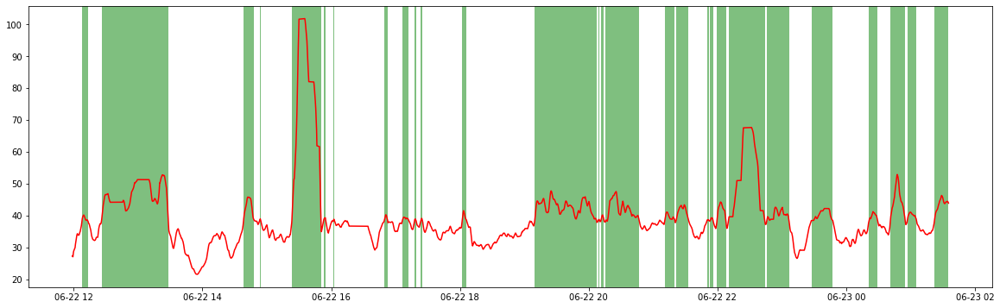

In [28]:
fig, ax = plt.subplots(figsize=(20,6)) 
ax.plot(hrv_features['datetime'],hrv_features['MAG_K500'],color='red')

for d in events_df.index:
    # print(events_df['Starting Timestamp'], events_df['Ending Timestamp'])
    ax.axvspan(events_df['Starting Timestamp'][d], events_df['Ending Timestamp'][d], facecolor="g", edgecolor="none", alpha=0.5)
ax.relim()
ax.autoscale_view()

    

In [ ]:
# events_df['Starting Timestamp'] > events_df['Ending Timestamp']

In [22]:
# region_of_interest_start = events_df['Starting Timestamp']
# region_of_interest_end = events_df['Ending Timestamp']


# fig, ax = plt.subplots(figsize=(20,6))
# ax.plot(hrv_features['datetime'],hrv_features['MAG_K500'],color='red')
# ax.axvspan(region_of_interest_start, region_of_interest_end,label="Region of Interests",color="blue", alpha=0.3)
# # ax.axvspan(Speech_start, Speech_end,label="Speech Emotion",color="green", alpha=0.3)
# # ax.axvspan(Food_start, Food_end,label="Food Selection",color="orange", alpha=0.3)
# ax.legend()

In [ ]:
# date_column = hrv_features.iloc[:, 0]
# feature_column = hrv_features['MAG_K500']

def find_above_threshold_indices(column):
    indices = []
    for i in range(len(column)):
        if column[i] >= mean_rmssd:
            indices.append(i)
    return indices

hrv_desired_indices = find_above_threshold_indices(hrv_features['MAG_K500'])
hrv_desired_indices

In [ ]:
a = hrv_features['MAG_K100']

[x[1] for x in enumerate(a) if x[0] in hrv_desired_indices]


In [ ]:
subdf = hrv_features.loc[hrv_desired_indices, :]


subdf = subdf.loc[:, ['datetime', 'MAG_K500']]
subdf

In [ ]:
fig = px.line(subdf, y='MAG_K500', x = 'datetime')
fig.show()

In [ ]:
subdf['datetime'] = subdf['datetime'].astype(str)

In [ ]:
subdf2 = subdf.reindex(list(range(0,subdf.index.max()+1)))
subdf2

In [ ]:
time_reindex_df = subdf.reindex(list(range(0,subdf.index.max()+1)), fill_value = 0)
time_reindex_df

In [ ]:
time_stamp_df = pd.to_datetime(time_reindex_df['datetime'])
time_stamp_df

In [ ]:
subdf2.to_csv('subdf2.csv')

# Accelerometer Data

In [4]:
import flirt.with_
acc_df = pd.read_csv('./' + dir + '/ACC.csv')


In [15]:
acc_features = flirt.get_acc_features(acc_df,
                                      window_length = 60, 
                                      window_step_size = 1,
                                      data_frequency = 32)

KeyboardInterrupt: 

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly
import zipfile,fnmatch,os
import flirt.reader.empatica

rootPath = r"./"
# pattern = '*.zip'
ZipFolderName = "062221_A02078.zip"
for root, dirs, files in os.walk(rootPath):
    for filename in fnmatch.filter(files, ZipFolderName):
        print(os.path.join(root, filename))
        zipfile.ZipFile(os.path.join(root, filename)).extractall(os.path.join(root, os.path.splitext(filename)[0]))

dir = os.path.splitext(ZipFolderName)[0]

./062221_A02078.zip


In [6]:
acc_df = pd.read_csv(rootPath+dir+'/ACC.csv')
acc_df = flirt.reader.empatica.read_acc_file_into_df(rootPath + dir + '/ACC.csv')
acc_df['Magnitude'] = np.sqrt(acc_df['acc_x']**2 + acc_df['acc_y']**2 + acc_df['acc_z']**2)
print("Magnitude Mean : ", acc_df['Magnitude'].mean())
acc_df.reset_index(inplace=True)
acc_df

Magnitude Mean :  63.72644524385312


,datetime,acc_x,acc_y,acc_z,Magnitude
0,2021-06-22 11:56:24+00:00,-6,48,41,63.411355
1,2021-06-22 11:56:24.031250+00:00,-7,48,41,63.513778
2,2021-06-22 11:56:24.062500+00:00,-6,48,40,62.769419
3,2021-06-22 11:56:24.093750+00:00,-6,48,40,62.769419
4,2021-06-22 11:56:24.125000+00:00,-6,48,41,63.411355
...,...,...,...,...,...
1579693,2021-06-23 01:39:09.406250+00:00,5,-8,62,62.713635
1579694,2021-06-23 01:39:09.437500+00:00,5,15,70,71.763500
1579695,2021-06-23 01:39:09.468750+00:00,5,21,73,76.124897
1579696,2021-06-23 01:39:09.500000+00:00,-17,-119,127,174.868522


In [7]:
hr_df = flirt.reader.empatica.read_hr_file_into_df('./' + dir + '/HR.csv')
hr_df.reset_index(inplace=True)
hr_df

,datetime,hr
0,2021-06-22 11:56:34+00:00,66.00
1,2021-06-22 11:56:35+00:00,66.50
2,2021-06-22 11:56:36+00:00,67.00
3,2021-06-22 11:56:37+00:00,67.25
4,2021-06-22 11:56:38+00:00,67.40
...,...,...
49346,2021-06-23 01:39:00+00:00,81.48
49347,2021-06-23 01:39:01+00:00,81.77
49348,2021-06-23 01:39:02+00:00,82.07
49349,2021-06-23 01:39:03+00:00,82.38


In [8]:
#defining a moving avg for smoothing the curve 
from tqdm.notebook import tqdm
def moving_avarage_smoothing(X,k):
	S = np.zeros(X.shape[0])
	for t in tqdm(range(X.shape[0])):
		if t < k:
			S[t] = np.mean(X[:t+1])
		else:
			S[t] = np.sum(X[t-k:t])/k
	return S

MAG_K500  = moving_avarage_smoothing(hr_df['hr'], 500)
hr_df['MAG_K500'] = MAG_K500
# acc_df.to_csv('acc_features.csv')
hr_df

,datetime,hr,MAG_K500
0,2021-06-22 11:56:34+00:00,66.00,66.00000
1,2021-06-22 11:56:35+00:00,66.50,66.25000
2,2021-06-22 11:56:36+00:00,67.00,66.50000
3,2021-06-22 11:56:37+00:00,67.25,66.68750
4,2021-06-22 11:56:38+00:00,67.40,66.83000
...,...,...,...
49346,2021-06-23 01:39:00+00:00,81.48,78.46826
49347,2021-06-23 01:39:01+00:00,81.77,78.48748
49348,2021-06-23 01:39:02+00:00,82.07,78.50746
49349,2021-06-23 01:39:03+00:00,82.38,78.52816


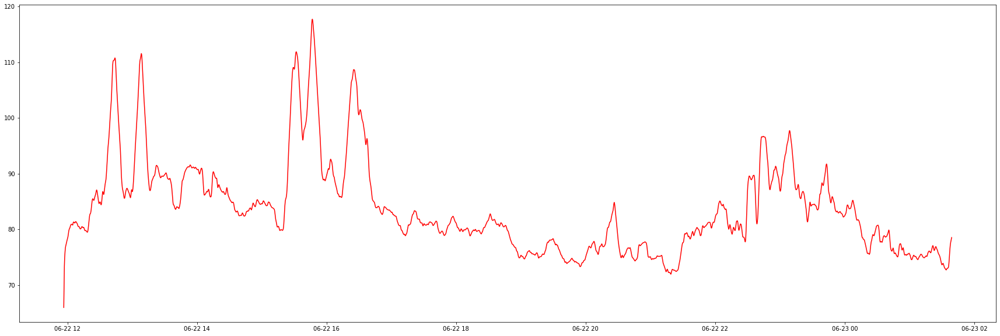

In [9]:
fig, ax3 = plt.subplots(figsize=(30,10)) 
ax3.plot(hr_df['datetime'],hr_df['MAG_K500'],color='red')

In [10]:
mean_acc_magnitude = hr_df['MAG_K500'].mean()
std_acc_magnitude = hr_df['MAG_K500'].std()
one_std_above_mean_acc = mean_acc_magnitude + std_acc_magnitude
print(mean_acc_magnitude, std_acc_magnitude)
print(one_std_above_mean_acc)

83.70845803125074 8.280773754437035
91.98923178568778


In [11]:
def deviation_above_mean_acc(unit):
  if unit == 0:
    return (mean_acc_magnitude)
  else:
    return (mean_acc_magnitude + (unit*std_acc_magnitude))

In [12]:

def Starting_timeStamp(column, time_frames):
    starting_time_index = []
    for i in range(len(column)-1):
        if column[i] < deviation_above_mean_acc(1) and column[i+1] > deviation_above_mean_acc(1):
            starting_time_index.append(time_frames[i])
    return starting_time_index
        
def Ending_timeStamp(column, time_frames):
    time_index = []
    for i in range(len(column)-1):
        if column[i] > deviation_above_mean_acc(1) and column[i+1] < deviation_above_mean_acc(1):
            time_index.append(time_frames[i])
    if column[len(column) -1 ] > deviation_above_mean_acc(1):
        time_index.insert(len(time_index), time_frames[len(time_frames) -1])
    else:
        pass        
    return time_index

In [13]:
  
starting_timestamp = Starting_timeStamp(hr_df['MAG_K500'], hr_df['datetime'])
ending_timestamp = Ending_timeStamp(hr_df['MAG_K500'], hr_df['datetime'])


In [14]:
print(starting_timestamp)
print(ending_timestamp)

[Timestamp('2021-06-22 12:36:40+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 13:02:04+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 15:24:25+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 16:03:09+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 16:17:37+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 22:41:21+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 23:03:39+0000', tz='UTC', freq='1000L')]
[Timestamp('2021-06-22 12:49:28+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 13:14:00+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 15:55:03+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 16:04:56+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 16:38:59+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 22:48:46+0000', tz='UTC', freq='1000L'), Timestamp('2021-06-22 23:12:21+0000', tz='UTC', freq='1000L')]


<Figure size 5040x720 with 0 Axes>

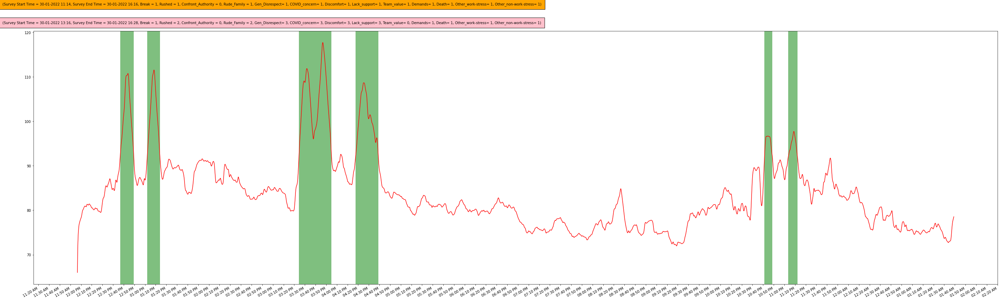

In [15]:
acc_df = hr_df

if len(starting_timestamp) < 1:
    fig, ax2 = plt.subplots(figsize=(30,10))
    ax2.plot(acc_df['datetime'],acc_df['MAG_K500'],color='red')
else:
    if starting_timestamp > ending_timestamp:
        ending_timestamp.pop(0)
    difference = [] # initialization of result list
    time_delta_minutes = []
    desired_time_index = []
    zip_object = zip(ending_timestamp, starting_timestamp)

    for list1_i, list2_i in zip_object:
        difference.append(list1_i-list2_i)# append each difference to list
        
    for i in difference:
        time_delta_minutes.append(i.total_seconds()/60)
        
    for i in range(len(time_delta_minutes)):
        if time_delta_minutes[i] > 3.00:
            desired_time_index.append(i)
            
    starting_timestamp_df = pd.DataFrame(starting_timestamp)
    ending_timestamp_df = pd.DataFrame(ending_timestamp)
    frames = (starting_timestamp_df, ending_timestamp_df)
    acc_events_df = pd.concat(frames,  axis=1)
    acc_events_df.columns = ['Starting Timestamp', 'Ending Timestamp']
    acc_events_df = acc_events_df.loc[desired_time_index, :]
    acc_events_df.to_csv(rootPath+"timestamp_" +dir+ "_ACC.csv")
    
    ema_df = pd.read_csv('L:/C O D E/UMBC VR Project/Stress_Detection/EMA_Survey/ema.csv')
    ema_df = ema_df.iloc[2: , :]
    ema_df.reset_index(inplace=True)

    date_range = []

    for i in range(len(ema_df)):
        date_range.append(('Survey Start Time = ' + ema_df.StartDate[i], 'Survey End Time = ' + ema_df.EndDate[i], 'Break = ' + ema_df.Break[i],
                        'Rushed = ' + ema_df.Rushed[i], 'Confront_Authority = '+ ema_df.Confront_authority[i],
                'Rude_Family = ' + ema_df.Rude_family[i], 'Gen_Disrespect= ' + ema_df.gen_disrespect[i],
                'COVID_concern= ' + ema_df.COVID_concern[i], 'Discomfort= ' + ema_df.Discomfort[i],
                'Lack_support= ' + ema_df.Lack_support[i],   'Team_value= ' + ema_df.Team_value[i],
                'Demands= ' + ema_df.Demands[i], 'Death= ' + ema_df.Death[i], 
                'Other_work-stress= ' + ema_df['Other_work-stress'][i],  'Other_non-work-stress= ' + ema_df['Other_non-work-stress'][i] ))
        
    Print_start_date_range = str(date_range[0]).replace("'", "")
    Print_end_date_range = str(date_range[1]).replace("'", "")  

    fig = plt.figure(figsize=(70,10))
    fig, ax2 = plt.subplots(figsize=(50,15)) 
    # ax2 = fig.add_subplot(121)
    
    plt.figtext(0.1, .95, Print_start_date_range, ha="left", fontsize=10, bbox={"facecolor":"orange", "alpha":2.0, "pad":10}, wrap= True)
    plt.figtext(0.1, .90, Print_end_date_range, ha="left", fontsize=10, bbox={"facecolor":"pink", "alpha":2.0, "pad":10},wrap = True)
    
    ax2.plot(acc_df['datetime'],acc_df['MAG_K500'],color='red')
    


    for d in acc_events_df.index:
        # print(events_df['Starting Timestamp'], events_df['Ending Timestamp'])
        ax2.axvspan(acc_events_df['Starting Timestamp'][d], acc_events_df['Ending Timestamp'][d], facecolor="g", edgecolor="none", alpha=0.5)
    ax2.relim()
    ax2.autoscale_view()

    import matplotlib.dates as mdates
    ax2.xaxis.set_major_locator(mdates.MinuteLocator(interval=10))   #to get a tick every 15 minutes
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%I:%M %p'))
    plt.gcf().autofmt_xdate()
    # fig, ax3 = plt.subplots(figsize=(30,10))
    # ax3 = fig.add_subplot(122)
    # font_size=14
    # bbox=[0, 0, 1, 1]
    # ax3.axis('off')
    # mpl_table = ax3.table(cellText = acc_events_df.values, rowLabels = acc_events_df.index, bbox=bbox, colLabels=acc_events_df.columns)
    # mpl_table.auto_set_font_size(False)
    # mpl_table.set_fontsize(font_size)

In [20]:

    
import pandas as pd

ema_df = pd.read_csv('L:/C O D E/UMBC VR Project/Stress_Detection/EMA_Survey/ema.csv')
ema_df = ema_df.iloc[2: , :]
ema_df.reset_index(inplace=True)

date_range = []

for i in range(len(ema_df)):
    date_range.append(('Survey Start Time = ' + ema_df.StartDate[i], 'Survey End Time = ' + ema_df.EndDate[i], 'Break = ' + ema_df.Break[i],
                    'Rushed = ' + ema_df.Rushed[i], 'Confront_Authority = '+ ema_df.Confront_authority[i],
            'Rude_Family = ' + ema_df.Rude_family[i], 'Gen_Disrespect= ' + ema_df.gen_disrespect[i],
            'COVID_concern= ' + ema_df.COVID_concern[i], 'Discomfort= ' + ema_df.Discomfort[i],
            'Lack_support= ' + ema_df.Lack_support[i],   'Team_value= ' + ema_df.Team_value[i],
            'Demands= ' + ema_df.Demands[i], 'Death= ' + ema_df.Death[i], 
            'Other_work-stress= ' + ema_df['Other_work-stress'][i],  'Other_non-work-stress= ' + ema_df['Other_non-work-stress'][i] ))
    
Print_start_date_range = str(date_range[0]).replace("'", "")
Print_end_date_range = str(date_range[1]).replace("'", "")  

plt.figtext(0.1, .95, Print_start_date_range, ha="left", fontsize=10, bbox={"facecolor":"orange", "alpha":2.0, "pad":10}, wrap= True)
plt.figtext(0.1, .90, Print_end_date_range, ha="left", fontsize=10, bbox={"facecolor":"pink", "alpha":2.0, "pad":10},wrap = True)


Text(0.1, 0.9, '(Survey Start Time = 30-01-2022 13:16, Survey End Time = 30-01-2022 16:28, Break = 1, Rushed = 2, Confront_Authority = 0, Rude_Family = 2, Gen_Disrespect= 3, COVID_concern= 3, Discomfort= 3, Lack_support= 3, Team_value= 0, Demands= 1, Death= 1, Other_work-stress= 1, Other_non-work-stress= 1)')

<Figure size 432x288 with 0 Axes>

In [123]:
if starting_timestamp > ending_timestamp:
    ending_timestamp.pop(0)

difference = [] # initialization of result list
time_delta_minutes = []
desired_time_index = []

zip_object = zip(ending_timestamp, starting_timestamp)

for list1_i, list2_i in zip_object:
    difference.append(list1_i-list2_i)# append each difference to list
    
for i in difference:
    time_delta_minutes.append(i.total_seconds()/60)
    
for i in range(len(time_delta_minutes)):
    if time_delta_minutes[i] > 2.00:
        desired_time_index.append(i)
        
starting_timestamp_df = pd.DataFrame(starting_timestamp)
ending_timestamp_df = pd.DataFrame(ending_timestamp)
frames = (starting_timestamp_df, ending_timestamp_df)
acc_events_df = pd.concat(frames,  axis=1)
acc_events_df.columns = ['Starting Timestamp', 'Ending Timestamp']
acc_events_df = acc_events_df.loc[desired_time_index, :]
acc_events_df.to_csv(rootPath+"timestamp_" +dir+ "_ACC.csv")

fig, ax2 = plt.subplots(figsize=(30,10)) 
ax2.plot(acc_df['datetime'],acc_df['MAG_K500'],color='red')

for d in acc_events_df.index:
    # print(events_df['Starting Timestamp'], events_df['Ending Timestamp'])
    ax2.axvspan(acc_events_df['Starting Timestamp'][d], acc_events_df['Ending Timestamp'][d], facecolor="g", edgecolor="none", alpha=0.5)
ax2.relim()
ax2.autoscale_view()

ValueError: Length mismatch: Expected axis has 0 elements, new values have 2 elements

In [19]:
import pandas as pd

cms = 

In [18]:
cd

C:\Users\charan
